# Satellite-Based Geographical Poverty Predictions

In [14]:
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, random_split
from segmentation_models_pytorch.metrics.functional import get_stats, iou_score
from tqdm import tqdm
import numpy as np
import seaborn as sns

from dataset import SatelliteImageDataset
from unet import UNet
from utils import (
    one_hot_to_image,
    plot_prediction,
    compute_accuracy,
    class_index_to_one_hot,
    class_index_to_image,
    get_color_patches,
    print_iou,
    get_iou_by_class
)

Load the dataset and split it into training and testing set

In [24]:
dataset = SatelliteImageDataset(
    image_dir='data/images',
    mask_dir='data/masks'
)

In [25]:
gen = torch.Generator()
gen.manual_seed(0)

train_set, test_set = random_split(dataset, [0.8, 0.2], generator=gen)

Visulize the 2nd image in the dataset

In [26]:
img, mask = dataset[1]

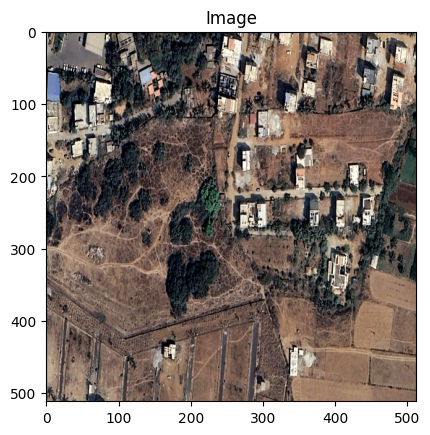

In [27]:
plt.imshow(img.permute(1, 2, 0))
plt.title('Image')
plt.show()

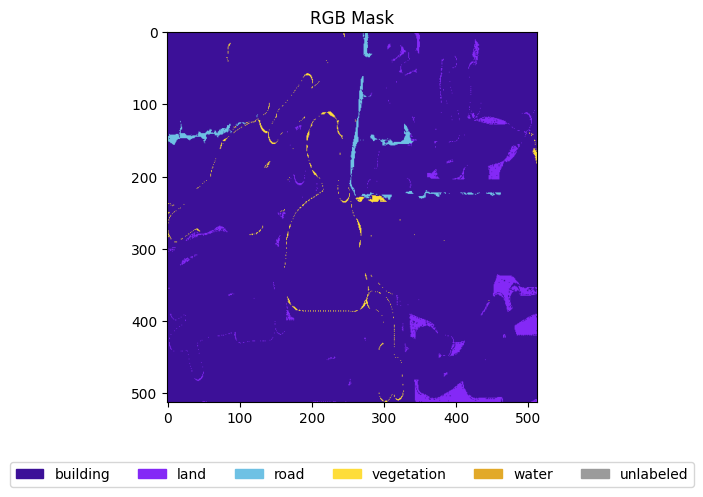

In [28]:
mask_rgb = class_index_to_image(torch.unsqueeze(mask, 0), dataset.color_map)[0]
plt.imshow(mask_rgb.permute(1, 2, 0))

patches = get_color_patches(dataset.color_map, dataset.mask_labels)
plt.legend(handles=patches, loc='lower center', bbox_to_anchor=(0.5, -0.25), fontsize=10, ncol=6)

plt.title('RGB Mask')
plt.show()

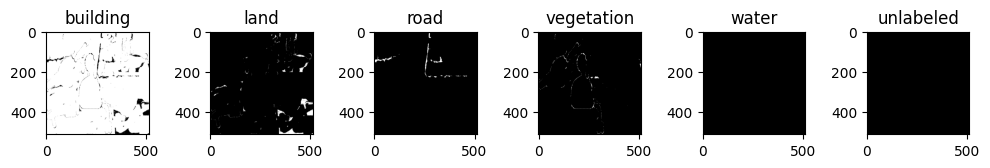

In [29]:
fig, axes = plt.subplots(1, 6, figsize=(10, 8))
mask = class_index_to_one_hot(mask, dataset.color_map)

for i in range(6):
    axes[i].imshow(mask[i], cmap='gray')
    axes[i].set_title(dataset.mask_labels[i])

plt.tight_layout()
plt.show()

In [30]:
gen = torch.Generator()
gen.manual_seed(0)

train_loader = DataLoader(train_set, shuffle=True, generator=gen)
test_loader = DataLoader(test_set)

Define the hyperparameters, optimizers and criterion function for the model 

In [31]:
LEARNING_RATE = 3e-4
EPOCHS = 100

In [32]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = UNet(in_channels=3, out_channels=6).to(device)

In [33]:
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
criterion = torch.nn.CrossEntropyLoss()

Train the model

Epoch 1:


Training: 100%|██████████| 96/96 [07:07<00:00,  4.45s/it]


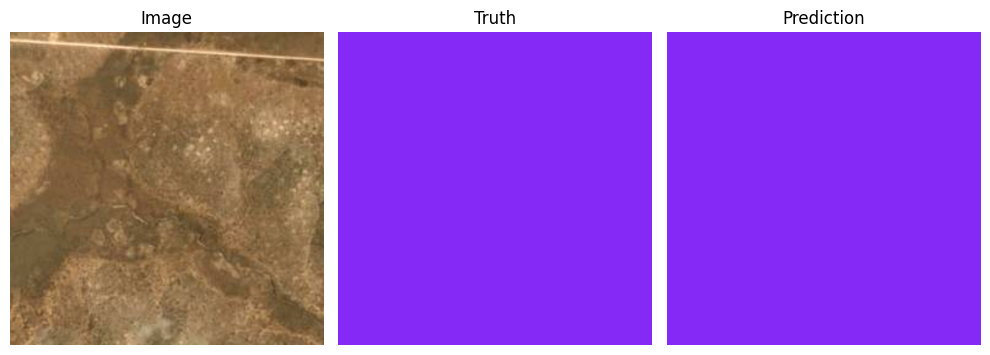

Accuracy: 0.5452 | Loss: 1.2419


Epoch 2:


Training: 100%|██████████| 96/96 [06:57<00:00,  4.35s/it]


Accuracy: 0.6515 | Loss: 0.9341


Epoch 3:


Training: 100%|██████████| 96/96 [07:05<00:00,  4.44s/it]


Accuracy: 0.6764 | Loss: 0.8872


Epoch 4:


Training: 100%|██████████| 96/96 [07:20<00:00,  4.59s/it]


Accuracy: 0.6623 | Loss: 0.9114


Epoch 5:


Training: 100%|██████████| 96/96 [07:12<00:00,  4.51s/it]


Accuracy: 0.6870 | Loss: 0.8612


Epoch 6:


Training: 100%|██████████| 96/96 [06:52<00:00,  4.29s/it]


Accuracy: 0.6915 | Loss: 0.8435


Epoch 7:


Training: 100%|██████████| 96/96 [06:44<00:00,  4.22s/it]


Accuracy: 0.6879 | Loss: 0.8694


Epoch 8:


Training: 100%|██████████| 96/96 [06:42<00:00,  4.19s/it]


Accuracy: 0.6959 | Loss: 0.8415


Epoch 9:


Training: 100%|██████████| 96/96 [06:42<00:00,  4.20s/it]


Accuracy: 0.7155 | Loss: 0.8217


Epoch 10:


Training: 100%|██████████| 96/96 [06:42<00:00,  4.19s/it]


Accuracy: 0.7162 | Loss: 0.7985


Epoch 11:


Training: 100%|██████████| 96/96 [07:41<00:00,  4.81s/it]


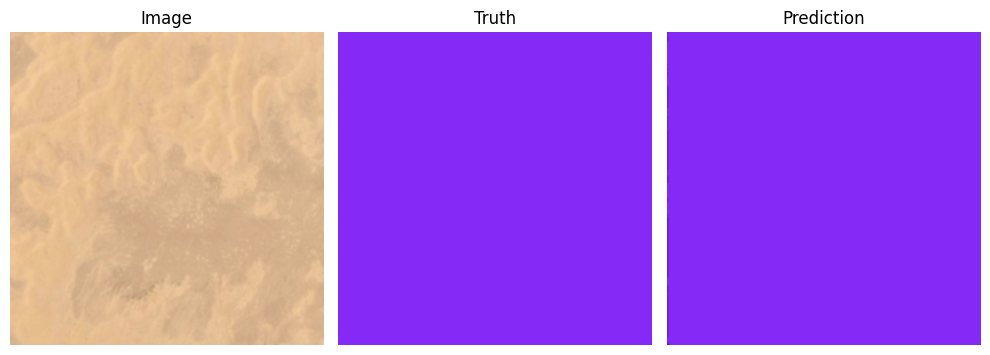

Accuracy: 0.7169 | Loss: 0.7997


Epoch 12:


Training: 100%|██████████| 96/96 [07:56<00:00,  4.96s/it]


Accuracy: 0.7193 | Loss: 0.7858


Epoch 13:


Training: 100%|██████████| 96/96 [07:34<00:00,  4.74s/it]


Accuracy: 0.7181 | Loss: 0.7805


Epoch 14:


Training: 100%|██████████| 96/96 [07:32<00:00,  4.72s/it]


Accuracy: 0.7263 | Loss: 0.7709


Epoch 15:


Training: 100%|██████████| 96/96 [07:25<00:00,  4.64s/it]


Accuracy: 0.7299 | Loss: 0.7706


Epoch 16:


Training: 100%|██████████| 96/96 [06:48<00:00,  4.25s/it]


Accuracy: 0.7291 | Loss: 0.7546


Epoch 17:


Training: 100%|██████████| 96/96 [06:42<00:00,  4.20s/it]


Accuracy: 0.7316 | Loss: 0.7522


Epoch 18:


Training: 100%|██████████| 96/96 [06:44<00:00,  4.22s/it]


Accuracy: 0.7237 | Loss: 0.7651


Epoch 19:


Training: 100%|██████████| 96/96 [06:56<00:00,  4.34s/it]


Accuracy: 0.7299 | Loss: 0.7637


Epoch 20:


Training: 100%|██████████| 96/96 [06:59<00:00,  4.37s/it]


Accuracy: 0.7337 | Loss: 0.7320


Epoch 21:


Training: 100%|██████████| 96/96 [06:54<00:00,  4.32s/it]


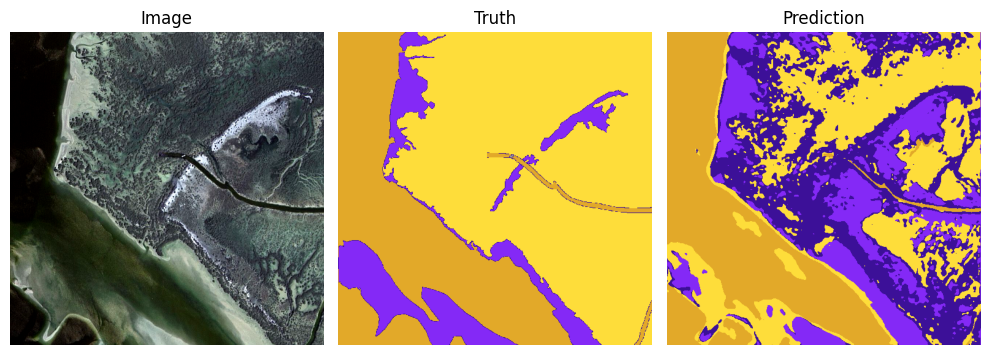

Accuracy: 0.7301 | Loss: 0.7503


Epoch 22:


Training: 100%|██████████| 96/96 [06:54<00:00,  4.32s/it]


Accuracy: 0.7306 | Loss: 0.7452


Epoch 23:


Training: 100%|██████████| 96/96 [06:43<00:00,  4.20s/it]


Accuracy: 0.7328 | Loss: 0.7357


Epoch 24:


Training: 100%|██████████| 96/96 [06:29<00:00,  4.05s/it]


Accuracy: 0.7409 | Loss: 0.7049


Epoch 25:


Training: 100%|██████████| 96/96 [06:22<00:00,  3.98s/it]


Accuracy: 0.7371 | Loss: 0.7183


Epoch 26:


Training: 100%|██████████| 96/96 [07:04<00:00,  4.42s/it]


Accuracy: 0.7406 | Loss: 0.6971


Epoch 27:


Training: 100%|██████████| 96/96 [08:04<00:00,  5.05s/it]


Accuracy: 0.7285 | Loss: 0.7459


Epoch 28:


Training: 100%|██████████| 96/96 [07:47<00:00,  4.87s/it]


Accuracy: 0.7472 | Loss: 0.6916


Epoch 29:


Training: 100%|██████████| 96/96 [07:38<00:00,  4.78s/it]


Accuracy: 0.7456 | Loss: 0.7019


Epoch 30:


Training: 100%|██████████| 96/96 [06:50<00:00,  4.28s/it]


Accuracy: 0.7472 | Loss: 0.6882


Epoch 31:


Training: 100%|██████████| 96/96 [06:31<00:00,  4.08s/it]


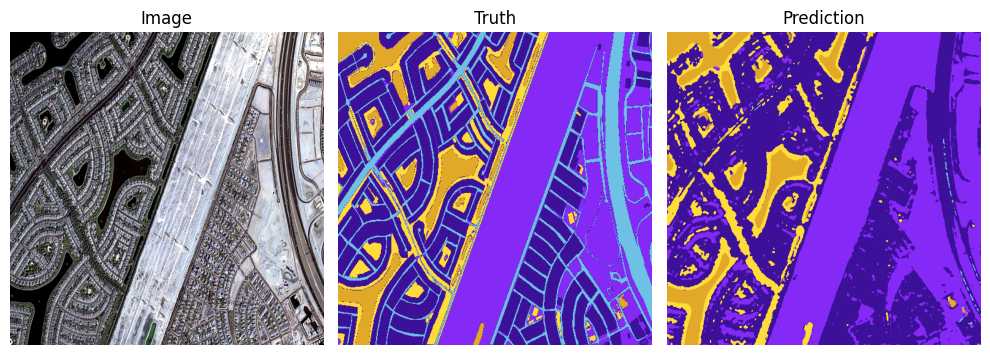

Accuracy: 0.7497 | Loss: 0.6751


Epoch 32:


Training: 100%|██████████| 96/96 [07:33<00:00,  4.73s/it]


Accuracy: 0.7532 | Loss: 0.6704


Epoch 33:


Training: 100%|██████████| 96/96 [07:36<00:00,  4.75s/it]


Accuracy: 0.7446 | Loss: 0.6820


Epoch 34:


Training: 100%|██████████| 96/96 [07:35<00:00,  4.75s/it]


Accuracy: 0.7518 | Loss: 0.6698


Epoch 35:


Training: 100%|██████████| 96/96 [07:54<00:00,  4.95s/it]


Accuracy: 0.7531 | Loss: 0.6589


Epoch 36:


Training: 100%|██████████| 96/96 [07:33<00:00,  4.72s/it]


Accuracy: 0.7432 | Loss: 0.7061


Epoch 37:


Training: 100%|██████████| 96/96 [07:03<00:00,  4.41s/it]


Accuracy: 0.7548 | Loss: 0.6644


Epoch 38:


Training: 100%|██████████| 96/96 [07:02<00:00,  4.40s/it]


Accuracy: 0.7544 | Loss: 0.6691


Epoch 39:


Training: 100%|██████████| 96/96 [07:39<00:00,  4.79s/it]


Accuracy: 0.7540 | Loss: 0.6671


Epoch 40:


Training: 100%|██████████| 96/96 [08:12<00:00,  5.13s/it]


Accuracy: 0.7599 | Loss: 0.6549


Epoch 41:


Training: 100%|██████████| 96/96 [08:10<00:00,  5.11s/it]


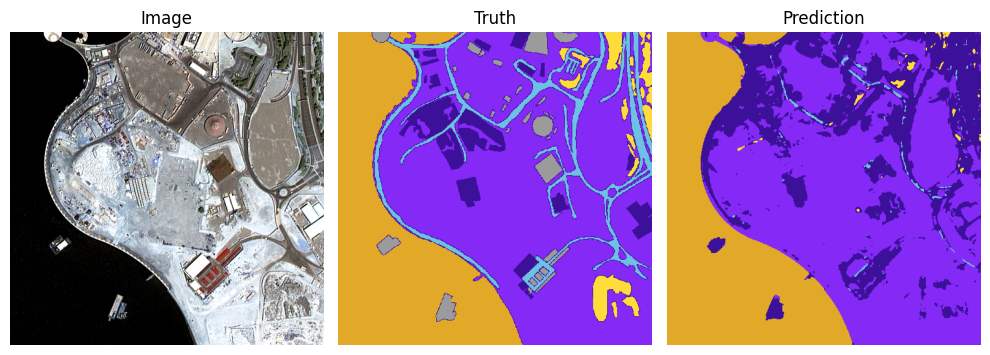

Accuracy: 0.7551 | Loss: 0.6731


Epoch 42:


Training: 100%|██████████| 96/96 [08:11<00:00,  5.12s/it]


Accuracy: 0.7637 | Loss: 0.6351


Epoch 43:


Training: 100%|██████████| 96/96 [07:30<00:00,  4.69s/it]


Accuracy: 0.7597 | Loss: 0.6496


Epoch 44:


Training: 100%|██████████| 96/96 [06:44<00:00,  4.21s/it]


Accuracy: 0.7661 | Loss: 0.6339


Epoch 45:


Training: 100%|██████████| 96/96 [06:39<00:00,  4.17s/it]


Accuracy: 0.7713 | Loss: 0.6284


Epoch 46:


Training: 100%|██████████| 96/96 [06:52<00:00,  4.29s/it]


Accuracy: 0.7657 | Loss: 0.6258


Epoch 47:


Training: 100%|██████████| 96/96 [07:15<00:00,  4.54s/it]


Accuracy: 0.7626 | Loss: 0.6380


Epoch 48:


Training: 100%|██████████| 96/96 [06:57<00:00,  4.35s/it]


Accuracy: 0.7631 | Loss: 0.6557


Epoch 49:


Training: 100%|██████████| 96/96 [06:54<00:00,  4.31s/it]


Accuracy: 0.7685 | Loss: 0.6330


Epoch 50:


Training: 100%|██████████| 96/96 [06:41<00:00,  4.18s/it]


Accuracy: 0.7774 | Loss: 0.6053


Epoch 51:


Training: 100%|██████████| 96/96 [06:49<00:00,  4.26s/it]


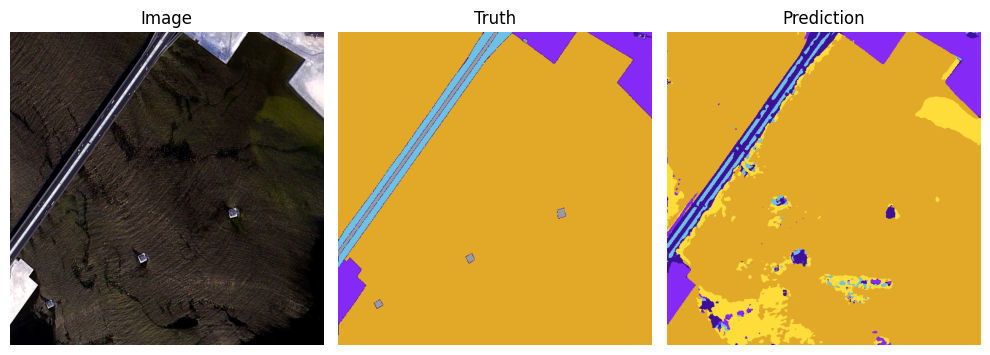

Accuracy: 0.7744 | Loss: 0.6029


Epoch 52:


Training: 100%|██████████| 96/96 [07:44<00:00,  4.84s/it]


Accuracy: 0.7765 | Loss: 0.5988


Epoch 53:


Training: 100%|██████████| 96/96 [08:12<00:00,  5.13s/it]


Accuracy: 0.7756 | Loss: 0.5955


Epoch 54:


Training: 100%|██████████| 96/96 [08:44<00:00,  5.46s/it]


Accuracy: 0.7758 | Loss: 0.5973


Epoch 55:


Training: 100%|██████████| 96/96 [07:39<00:00,  4.78s/it]


Accuracy: 0.7801 | Loss: 0.5983


Epoch 56:


Training: 100%|██████████| 96/96 [07:26<00:00,  4.65s/it]


Accuracy: 0.7808 | Loss: 0.5890


Epoch 57:


Training: 100%|██████████| 96/96 [07:14<00:00,  4.53s/it]


Accuracy: 0.7869 | Loss: 0.5689


Epoch 58:


Training: 100%|██████████| 96/96 [18:36<00:00, 11.63s/it]   


Accuracy: 0.7829 | Loss: 0.5744


Epoch 59:


Training: 100%|██████████| 96/96 [06:46<00:00,  4.24s/it]


Accuracy: 0.7854 | Loss: 0.5692


Epoch 60:


Training: 100%|██████████| 96/96 [07:06<00:00,  4.44s/it]


Accuracy: 0.7885 | Loss: 0.5808


Epoch 61:


Training: 100%|██████████| 96/96 [07:05<00:00,  4.43s/it]


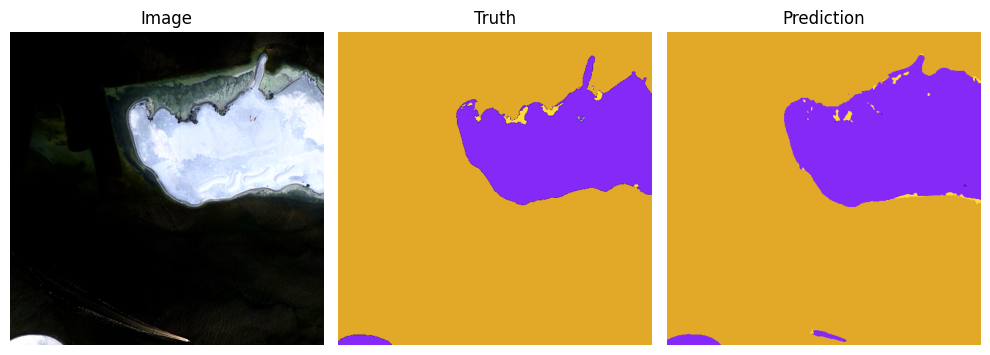

Accuracy: 0.7801 | Loss: 0.5872


Epoch 62:


Training: 100%|██████████| 96/96 [07:08<00:00,  4.46s/it]


Accuracy: 0.7599 | Loss: 0.7298


Epoch 63:


Training: 100%|██████████| 96/96 [07:14<00:00,  4.52s/it]


Accuracy: 0.7790 | Loss: 0.6039


Epoch 64:


Training: 100%|██████████| 96/96 [07:07<00:00,  4.46s/it]


Accuracy: 0.7824 | Loss: 0.5901


Epoch 65:


Training: 100%|██████████| 96/96 [06:45<00:00,  4.23s/it]


Accuracy: 0.7905 | Loss: 0.5616


Epoch 66:


Training: 100%|██████████| 96/96 [06:44<00:00,  4.22s/it]


Accuracy: 0.7925 | Loss: 0.5600


Epoch 67:


Training: 100%|██████████| 96/96 [06:48<00:00,  4.26s/it]


Accuracy: 0.7922 | Loss: 0.5611


Epoch 68:


Training: 100%|██████████| 96/96 [06:47<00:00,  4.25s/it]


Accuracy: 0.7945 | Loss: 0.5455


Epoch 69:


Training: 100%|██████████| 96/96 [07:42<00:00,  4.82s/it]


Accuracy: 0.7899 | Loss: 0.5651


Epoch 70:


Training: 100%|██████████| 96/96 [07:48<00:00,  4.88s/it]


Accuracy: 0.7907 | Loss: 0.5472


Epoch 71:


Training: 100%|██████████| 96/96 [07:39<00:00,  4.78s/it]


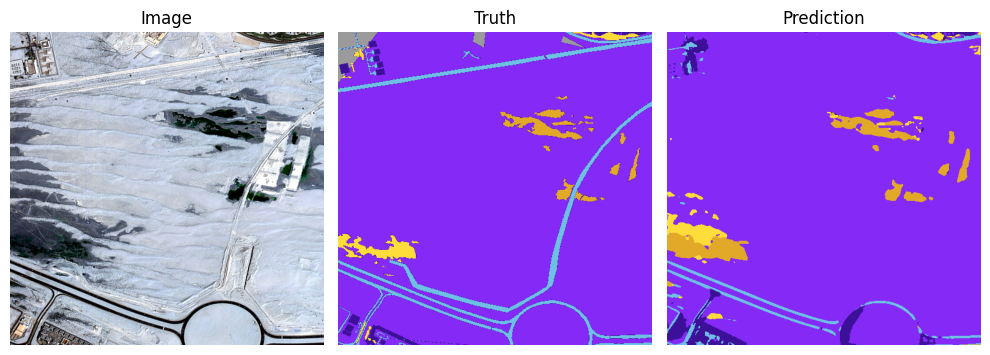

Accuracy: 0.7956 | Loss: 0.5359


Epoch 72:


Training: 100%|██████████| 96/96 [07:38<00:00,  4.77s/it]


Accuracy: 0.7850 | Loss: 0.5760


Epoch 73:


Training: 100%|██████████| 96/96 [07:39<00:00,  4.79s/it]


Accuracy: 0.7672 | Loss: 0.6235


Epoch 74:


Training: 100%|██████████| 96/96 [07:01<00:00,  4.39s/it]


Accuracy: 0.7941 | Loss: 0.5536


Epoch 75:


Training: 100%|██████████| 96/96 [07:58<00:00,  4.98s/it]


Accuracy: 0.7915 | Loss: 0.5522


Epoch 76:


Training: 100%|██████████| 96/96 [08:17<00:00,  5.19s/it]


Accuracy: 0.7979 | Loss: 0.5381


Epoch 77:


Training: 100%|██████████| 96/96 [08:26<00:00,  5.27s/it]


Accuracy: 0.7949 | Loss: 0.5361


Epoch 78:


Training: 100%|██████████| 96/96 [08:16<00:00,  5.17s/it]


Accuracy: 0.7959 | Loss: 0.5485


Epoch 79:


Training: 100%|██████████| 96/96 [07:42<00:00,  4.82s/it]


Accuracy: 0.7997 | Loss: 0.5357


Epoch 80:


Training: 100%|██████████| 96/96 [07:27<00:00,  4.66s/it]


Accuracy: 0.8031 | Loss: 0.5127


Epoch 81:


Training: 100%|██████████| 96/96 [07:24<00:00,  4.63s/it]


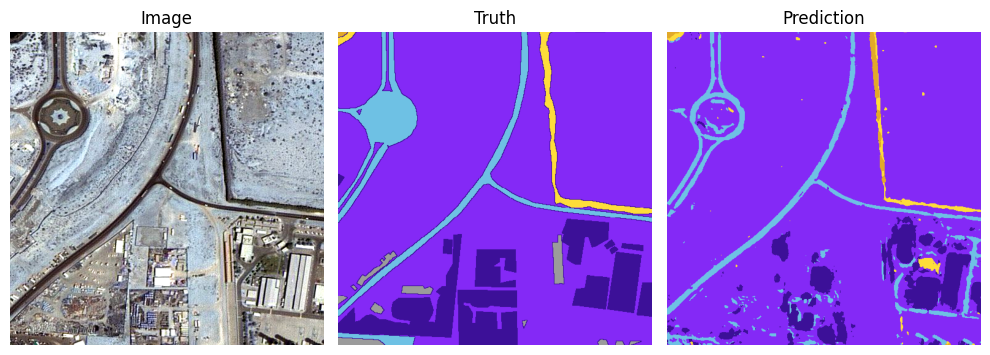

Accuracy: 0.8068 | Loss: 0.5104


Epoch 82:


Training: 100%|██████████| 96/96 [07:38<00:00,  4.78s/it]


Accuracy: 0.8043 | Loss: 0.5079


Epoch 83:


Training: 100%|██████████| 96/96 [07:33<00:00,  4.72s/it]


Accuracy: 0.8064 | Loss: 0.5085


Epoch 84:


Training: 100%|██████████| 96/96 [07:20<00:00,  4.58s/it]


Accuracy: 0.8040 | Loss: 0.5128


Epoch 85:


Training: 100%|██████████| 96/96 [07:30<00:00,  4.70s/it]


Accuracy: 0.8065 | Loss: 0.5062


Epoch 86:


Training: 100%|██████████| 96/96 [07:30<00:00,  4.69s/it]


Accuracy: 0.8036 | Loss: 0.5045


Epoch 87:


Training: 100%|██████████| 96/96 [06:45<00:00,  4.22s/it]


Accuracy: 0.8094 | Loss: 0.4967


Epoch 88:


Training: 100%|██████████| 96/96 [06:41<00:00,  4.18s/it]


Accuracy: 0.8116 | Loss: 0.4927


Epoch 89:


Training: 100%|██████████| 96/96 [07:11<00:00,  4.49s/it]


Accuracy: 0.8118 | Loss: 0.4887


Epoch 90:


Training: 100%|██████████| 96/96 [07:11<00:00,  4.49s/it]


Accuracy: 0.8194 | Loss: 0.4748


Epoch 91:


Training: 100%|██████████| 96/96 [07:10<00:00,  4.49s/it]


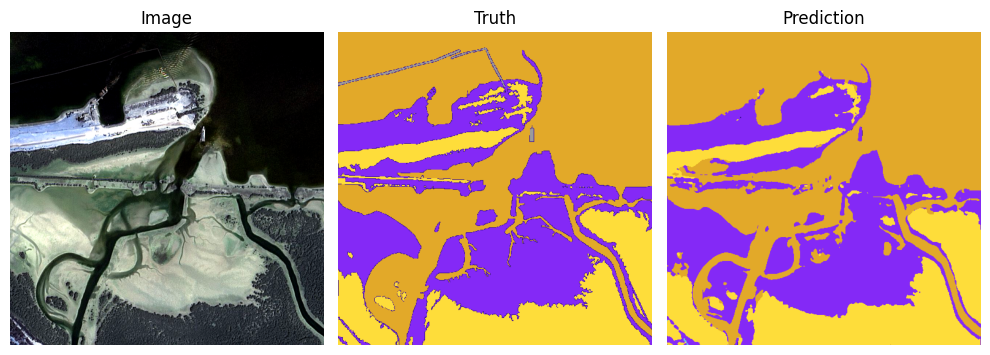

Accuracy: 0.8122 | Loss: 0.4879


Epoch 92:


Training: 100%|██████████| 96/96 [07:12<00:00,  4.50s/it]


Accuracy: 0.8200 | Loss: 0.4714


Epoch 93:


Training: 100%|██████████| 96/96 [07:04<00:00,  4.43s/it]


Accuracy: 0.8221 | Loss: 0.4722


Epoch 94:


Training: 100%|██████████| 96/96 [07:07<00:00,  4.46s/it]


Accuracy: 0.8162 | Loss: 0.4872


Epoch 95:


Training: 100%|██████████| 96/96 [07:09<00:00,  4.48s/it]


Accuracy: 0.8165 | Loss: 0.4721


Epoch 96:


Training: 100%|██████████| 96/96 [07:11<00:00,  4.49s/it]


Accuracy: 0.8268 | Loss: 0.4504


Epoch 97:


Training: 100%|██████████| 96/96 [07:07<00:00,  4.45s/it]


Accuracy: 0.8265 | Loss: 0.4494


Epoch 98:


Training: 100%|██████████| 96/96 [07:07<00:00,  4.45s/it]


Accuracy: 0.8275 | Loss: 0.4469


Epoch 99:


Training: 100%|██████████| 96/96 [06:59<00:00,  4.37s/it]


Accuracy: 0.8272 | Loss: 0.4528


Epoch 100:


Training: 100%|██████████| 96/96 [06:33<00:00,  4.10s/it]

Accuracy: 0.8195 | Loss: 0.4622




In [34]:
loss_list = []
acc_list = []

for epoch in range(EPOCHS):
    print(f'Epoch {epoch + 1}:')

    model.train()
    running_loss = 0
    running_acc = 0

    for x, y in tqdm(train_loader, desc='Training', colour='#00FF00'):
        x, y = x.to(device), y.to(device) # y: (b, h, w)
        y_pred = model(x) # y_pred: (b, 6, h, w)

        loss = criterion(y_pred, y)
        running_loss += loss.item()

        # compute the accuracy of the prediction
        running_acc += compute_accuracy(y, y_pred, device)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    if epoch % 10 == 0:
        # show first image in the last batch with matplotlib
        y_imgs = class_index_to_image(y, dataset.color_map, device)
        pred_imgs = one_hot_to_image(y_pred, dataset.color_map, device)
        plot_prediction(x, y_imgs, pred_imgs, dataset.color_map, dataset.mask_labels)

    epoch_acc = running_acc / len(train_loader)
    epoch_loss = running_loss / len(train_loader)
    acc_list.append(epoch_acc)
    loss_list.append(epoch_loss)

    print(f'Accuracy: {epoch_acc:.4f} | Loss: {epoch_loss:.4f}')
    print('\n')


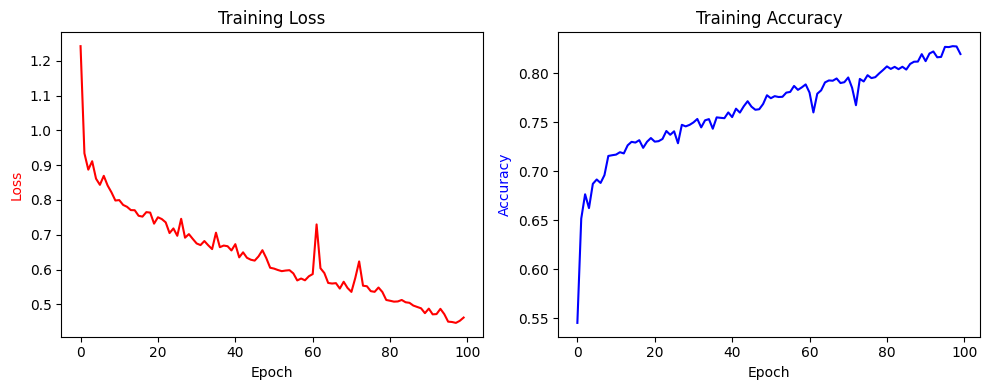

In [35]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].plot(loss_list, color='red')
axes[0].set_ylabel('Loss', color='red')
axes[0].set_xlabel('Epoch')
axes[0].set_title('Training Loss')

axes[1].plot(acc_list, color='blue')
axes[1].set_ylabel('Accuracy', color='blue')
axes[1].set_xlabel('Epoch')
axes[1].set_title('Training Accuracy')

plt.tight_layout()
plt.show()

Test the model with the test set

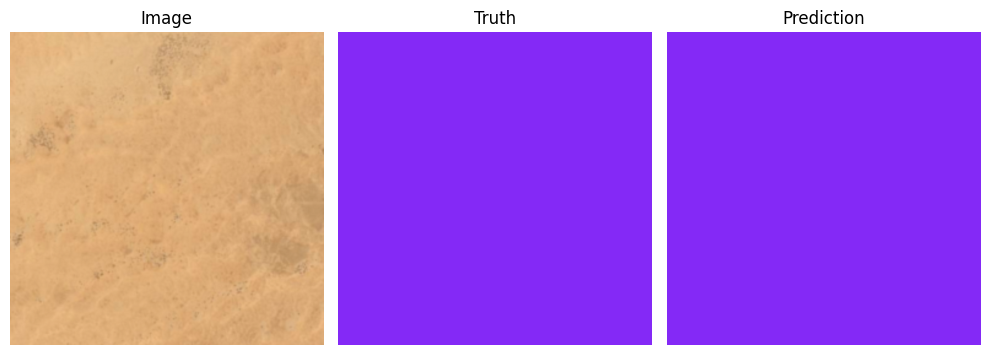

Accuracy: 1.0000 | Loss: 0.0000
IOU... building: 1.00 land: 1.00 road: 1.00 vegetation: 1.00 water: 1.00 unlabeled: 1.00 




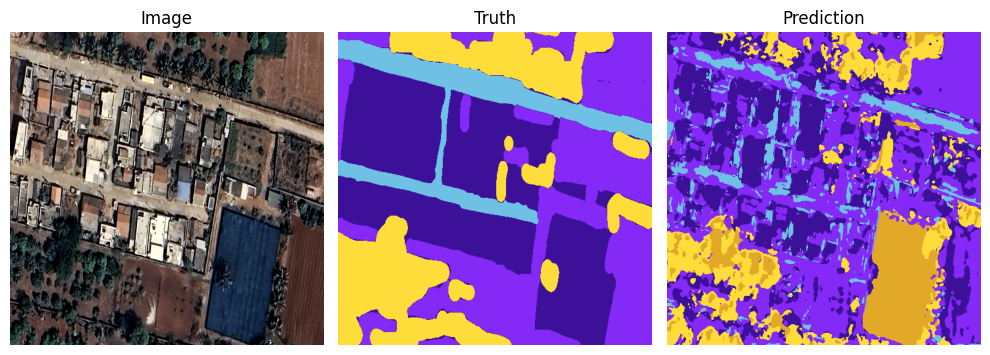

Accuracy: 0.4842 | Loss: 1.1959
IOU... building: 0.30 land: 0.40 road: 0.24 vegetation: 0.37 




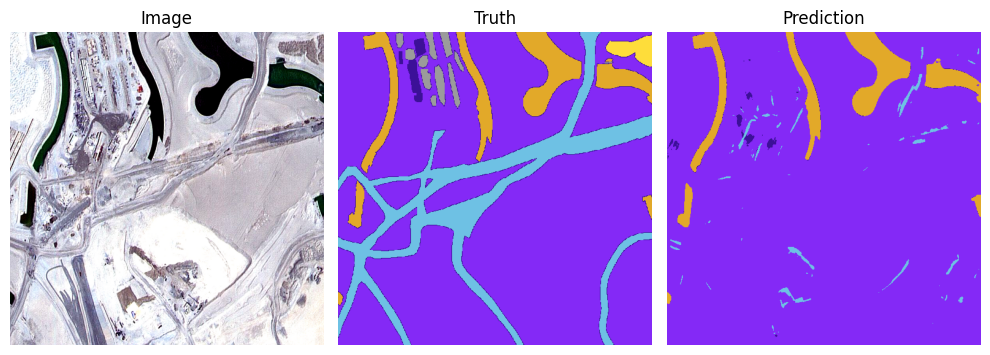

Accuracy: 0.8036 | Loss: 0.6029
IOU... building: 0.02 land: 0.79 road: 0.03 water: 0.94 




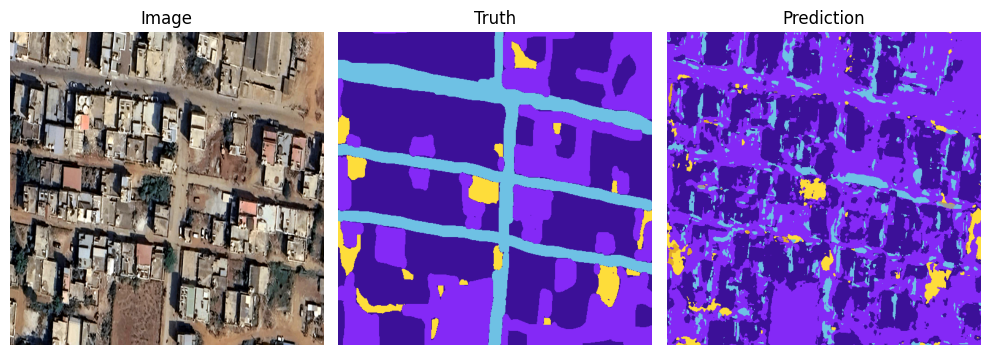

Accuracy: 0.5521 | Loss: 1.0043
IOU... building: 0.49 land: 0.38 road: 0.11 vegetation: 0.31 




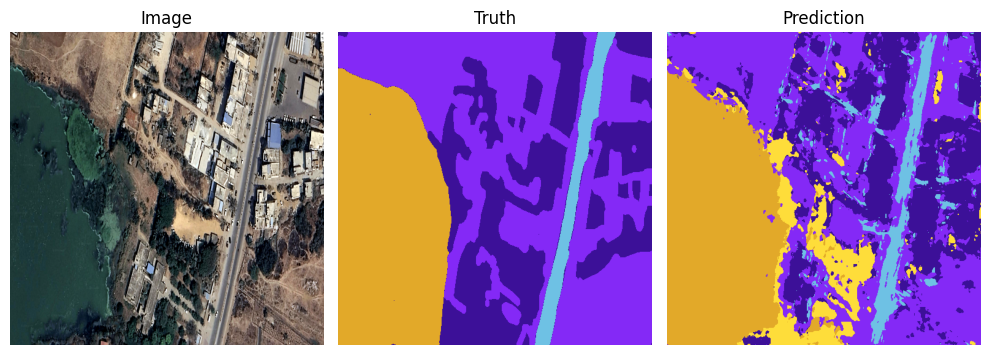

Accuracy: 0.7150 | Loss: 0.7229
IOU... building: 0.39 land: 0.59 road: 0.42 water: 0.91 




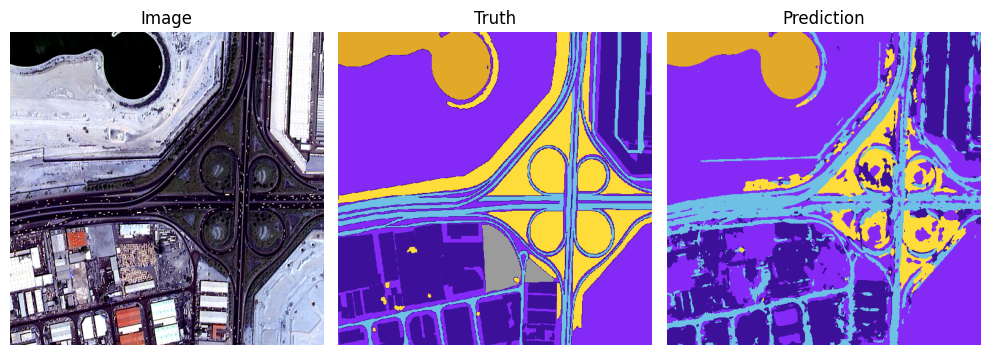

Accuracy: 0.6900 | Loss: 0.8331
IOU... building: 0.46 land: 0.59 road: 0.48 vegetation: 0.41 water: 0.99 




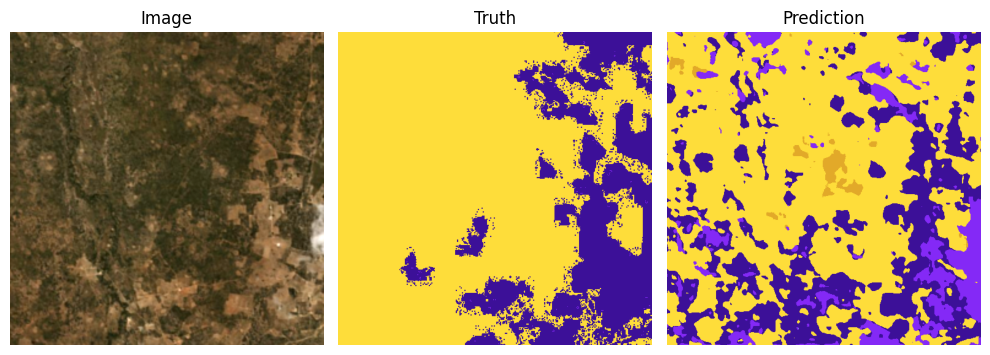

Accuracy: 0.6918 | Loss: 0.7581
IOU... building: 0.33 land: 0.00 vegetation: 0.69 unlabeled: 1.00 




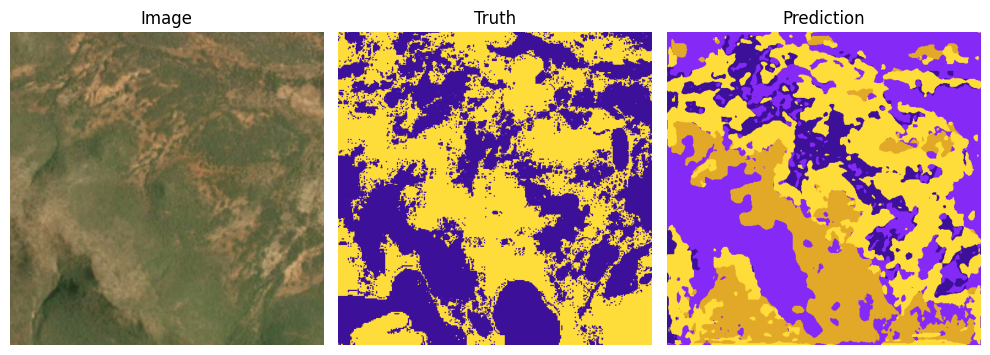

Accuracy: 0.3401 | Loss: 2.2365
IOU... building: 0.18 land: 0.00 road: 1.00 vegetation: 0.42 unlabeled: 1.00 




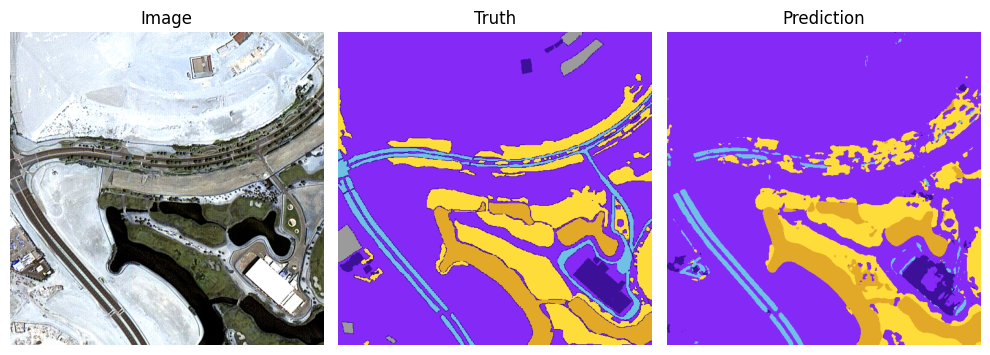

Accuracy: 0.8426 | Loss: 0.4570
IOU... building: 0.18 land: 0.84 road: 0.39 vegetation: 0.62 water: 0.80 




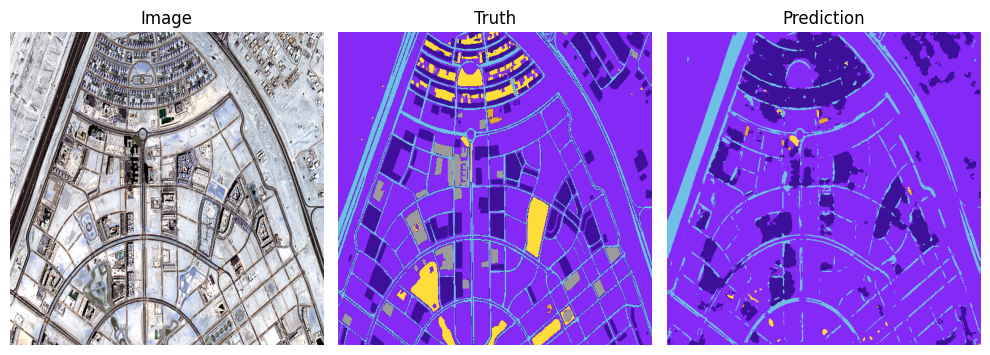

Accuracy: 0.7632 | Loss: 0.7215
IOU... building: 0.44 land: 0.76 road: 0.49 vegetation: 0.04 water: 0.24 




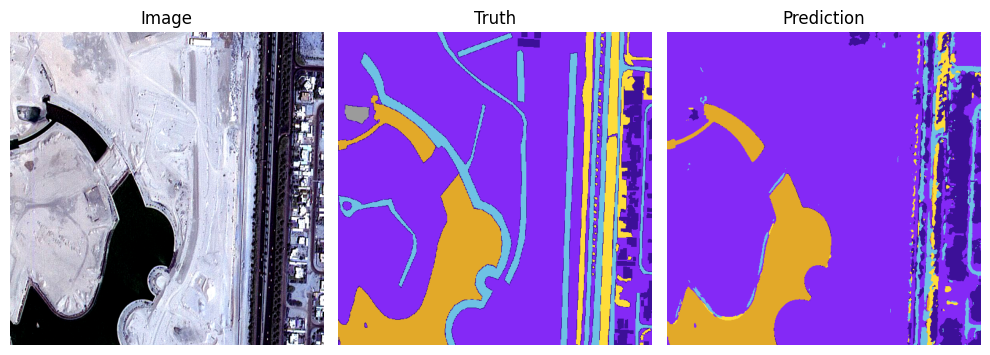

Accuracy: 0.7829 | Loss: 0.6351
IOU... building: 0.29 land: 0.78 road: 0.20 vegetation: 0.19 water: 0.96 




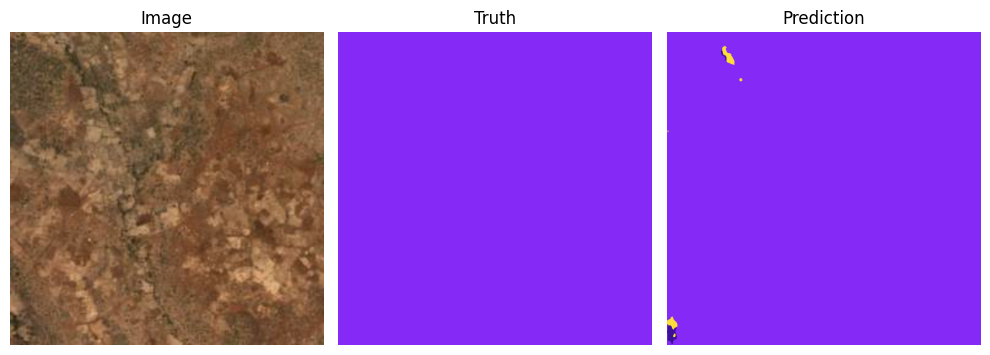

Accuracy: 0.9967 | Loss: 0.0097
IOU... land: 1.00 road: 1.00 unlabeled: 1.00 




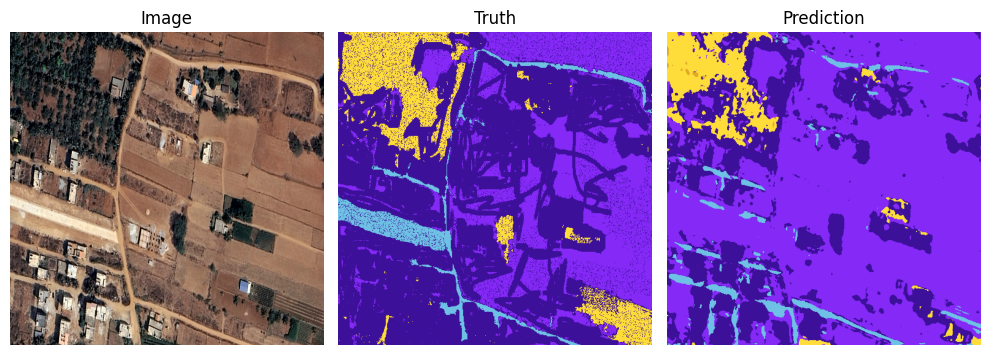

Accuracy: 0.5163 | Loss: 0.9216
IOU... building: 0.32 land: 0.39 road: 0.16 vegetation: 0.35 unlabeled: 1.00 




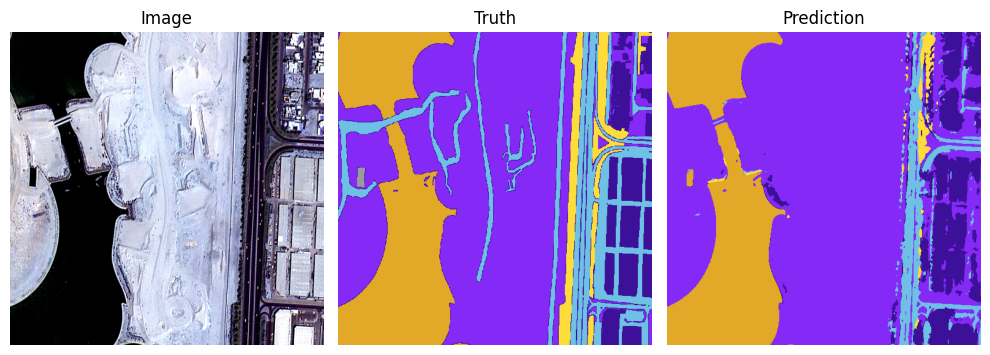

Accuracy: 0.7936 | Loss: 0.6258
IOU... building: 0.44 land: 0.75 road: 0.29 vegetation: 0.12 water: 0.98 unlabeled: 0.08 




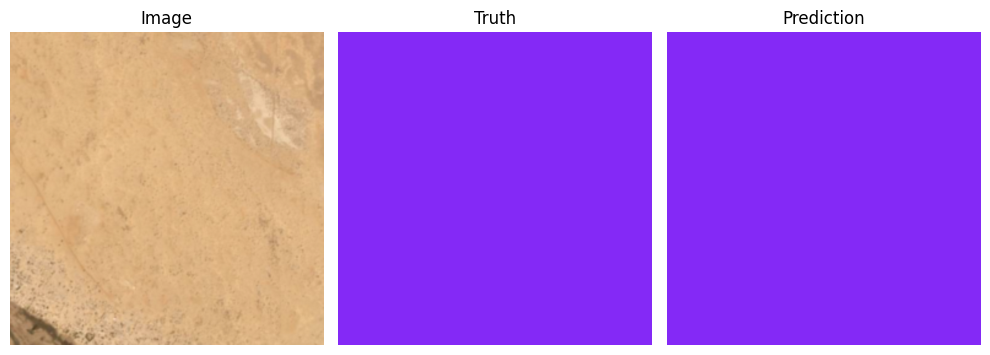

Accuracy: 1.0000 | Loss: 0.0001
IOU... building: 1.00 land: 1.00 road: 1.00 vegetation: 1.00 water: 1.00 unlabeled: 1.00 




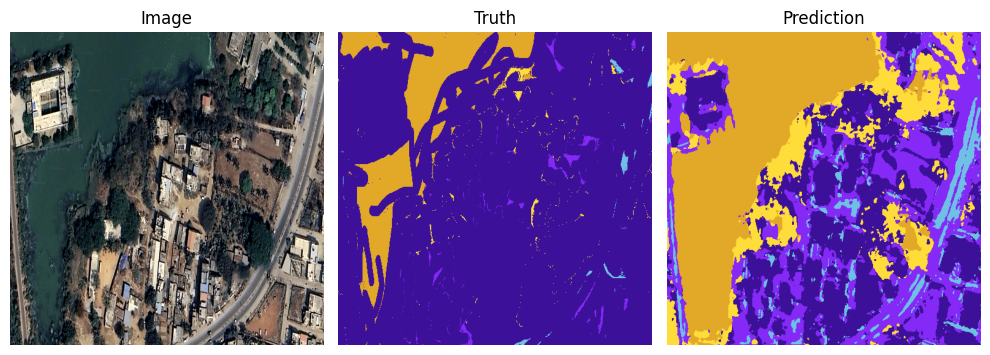

Accuracy: 0.4007 | Loss: 1.3129
IOU... building: 0.33 land: 0.03 road: 0.01 vegetation: 0.01 water: 0.35 unlabeled: 1.00 




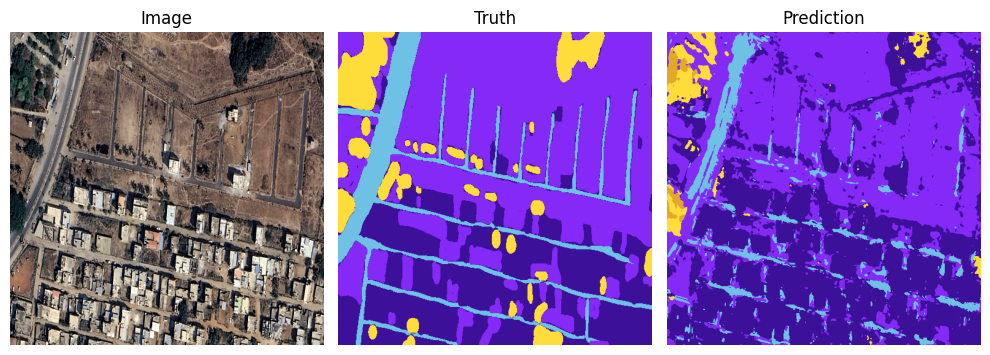

Accuracy: 0.6734 | Loss: 0.8510
IOU... building: 0.50 land: 0.61 road: 0.30 vegetation: 0.25 unlabeled: 1.00 




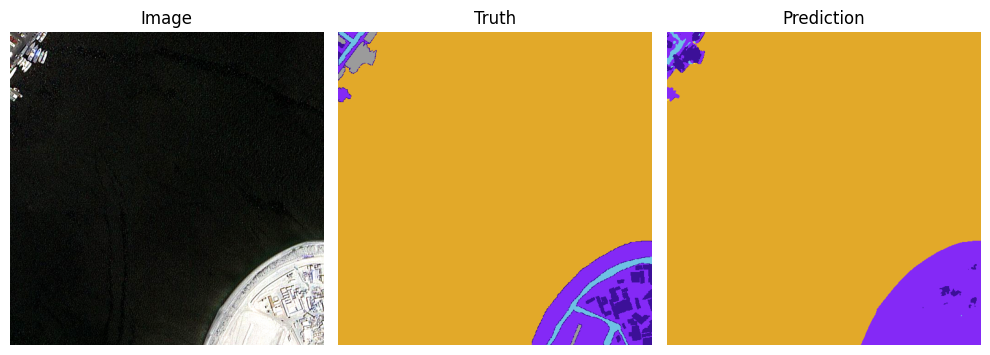

Accuracy: 0.9587 | Loss: 0.1288
IOU... building: 0.06 land: 0.64 road: 0.11 water: 1.00 




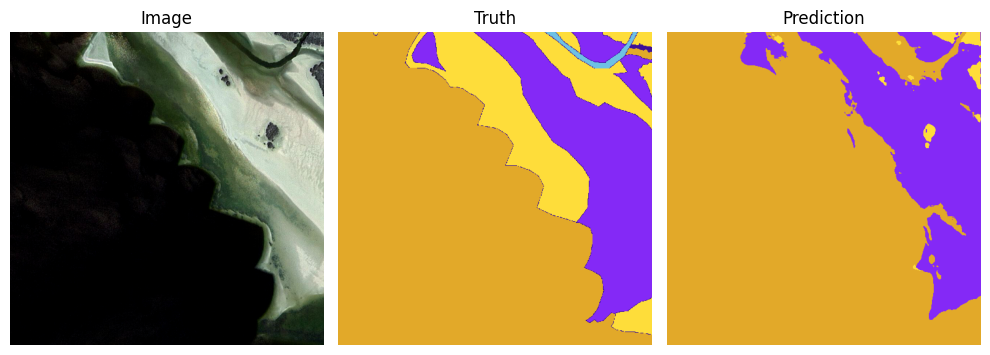

Accuracy: 0.8166 | Loss: 0.7367
IOU... land: 0.77 vegetation: 0.05 water: 0.82 unlabeled: 1.00 




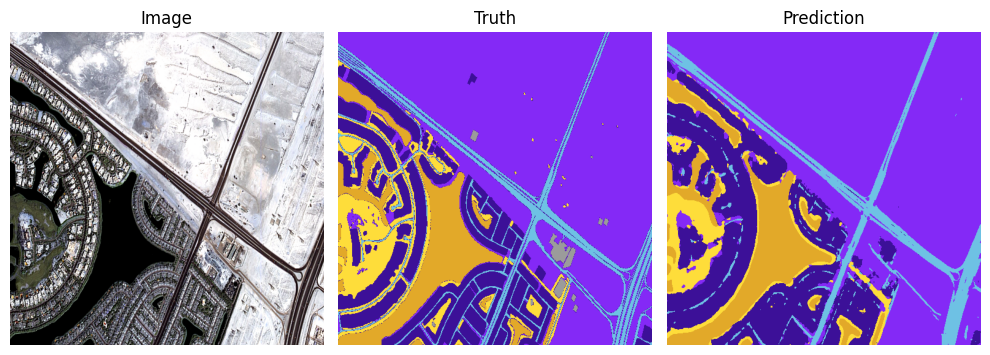

Accuracy: 0.8663 | Loss: 0.3978
IOU... building: 0.63 land: 0.90 road: 0.60 vegetation: 0.40 water: 0.94 




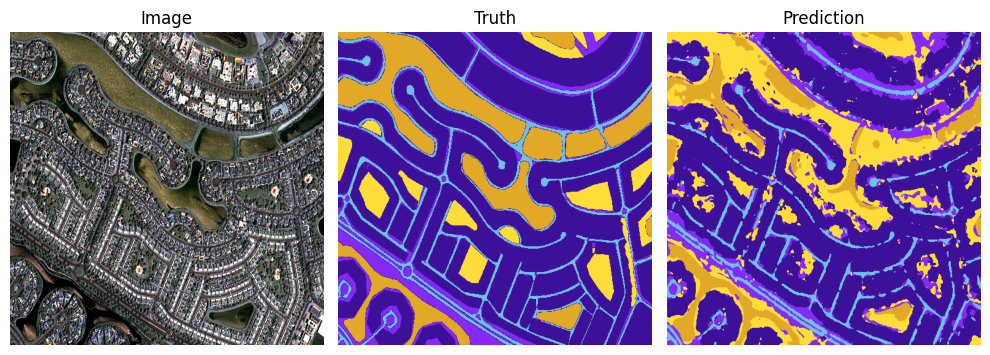

Accuracy: 0.6887 | Loss: 1.0262
IOU... building: 0.76 land: 0.24 road: 0.44 vegetation: 0.15 water: 0.43 unlabeled: 1.00 




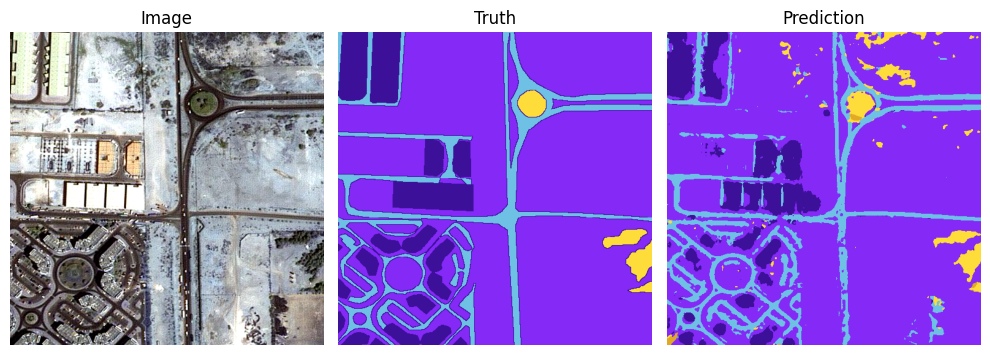

Accuracy: 0.8516 | Loss: 0.4377
IOU... building: 0.47 land: 0.85 road: 0.57 vegetation: 0.42 unlabeled: 1.00 




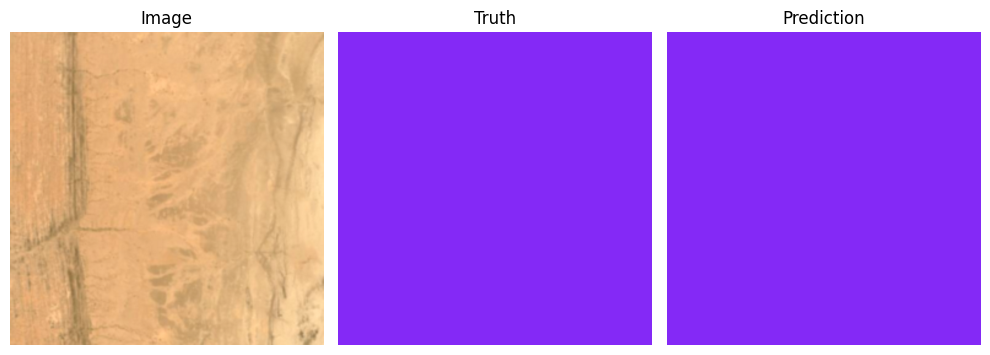

Accuracy: 1.0000 | Loss: 0.0000
IOU... building: 1.00 land: 1.00 road: 1.00 vegetation: 1.00 water: 1.00 unlabeled: 1.00 




In [36]:
test_acc_list = []
iou_list = torch.tensor([])
count = 0

with torch.no_grad():
    for x, y in test_loader:
        x, y = x.to(device), y.to(device) # y: (b, h, w)
        y_pred = model(x) # y_pred: (b, 6, h, w)

        loss = criterion(y_pred, y)

        # compute accuracy 
        acc = compute_accuracy(y, y_pred, device)
        test_acc_list.append(acc.item())

        # compute iou scores 
        y_pred_argmax = torch.argmax(y_pred, 1)
        tp, fp, fn, tn = get_stats(y_pred_argmax, y, mode='multiclass', num_classes=6)
        iou = iou_score(tp, fp, fn, tn)
        iou_list = torch.cat((iou_list, iou))

        # print predicted images
        y_imgs = class_index_to_image(y, dataset.color_map, device)
        pred_imgs = one_hot_to_image(y_pred, dataset.color_map, device)
        plot_prediction(x, y_imgs, pred_imgs, dataset.color_map, dataset.mask_labels)

        count += 1

        print(f'Accuracy: {acc:.4f} | Loss: {loss:.4f}')
        print_iou(iou[0], dataset.mask_labels)
        print('\n')

In [37]:
mean_test_acc = np.mean(test_acc_list)
print(f'The mean test set accuracy is {mean_test_acc:.4f}')

The mean test set accuracy is 0.7490


In [38]:
iou_scores = get_iou_by_class(iou_list, avg=True)
print_iou(iou_scores, dataset.mask_labels)

mean_iou_scores = np.mean(iou_scores)
print(f'Mean IOU: {mean_iou_scores}')

IOU... building: 0.46 land: 0.62 road: 0.47 vegetation: 0.41 water: 0.82 unlabeled: 0.93 
Mean IOU: 0.6183226605256399


Save the model for future inference

In [39]:
checkpoint = {
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'train_loss_list': loss_list,
    'train_acc_list': acc_list,
    'test_acc': mean_test_acc,
    'test_iou_scores': get_iou_by_class(iou_list),
    'test_mean_iou_scores': get_iou_by_class(iou_list, avg=True)
}

In [40]:
torch.save(checkpoint, 'unet/unet_100ep_checkpoint.pth')

Visualize the model accuracy

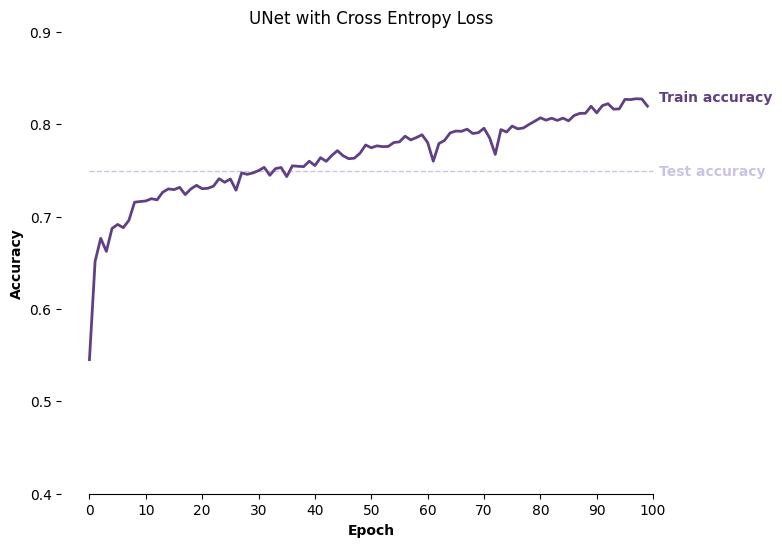

In [41]:
fig, ax = plt.subplots(figsize=(8, 6))

ax.plot(
    [0, EPOCHS], 
    [mean_test_acc, mean_test_acc],
    label="Test accuracy",
    color="#CBC3E3",
    linestyle="--",
    linewidth=1,
)

ax.text(
    EPOCHS * 1.01,
    mean_test_acc,
    "Test accuracy",
    color="#CBC3E3",
    fontweight="bold",
    horizontalalignment="left",
    verticalalignment="center",
)

ax.plot(
    acc_list,
    label="Train accuracy",
    color="#603F83FF",
    linewidth=2,
)

ax.text(
    EPOCHS * 1.01,
    acc_list[-1] + 0.009,
    "Train accuracy",
    color="#603F83FF",
    fontweight="bold",
    horizontalalignment="left",
    verticalalignment="center",
)

ax.spines["right"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["top"].set_visible(False)

ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")
ax.spines["bottom"].set_bounds(0, EPOCHS)

ax.set_xticks(np.arange(0, EPOCHS + 1, 10))
ax.set_yticks(np.arange(0.4, 1.0, 0.1))

ax.set_xlabel("Epoch", fontweight="bold")
ax.set_ylabel("Accuracy", fontweight="bold")

plt.title('UNet with Cross Entropy Loss')
plt.show()

Show the IOU score for each class

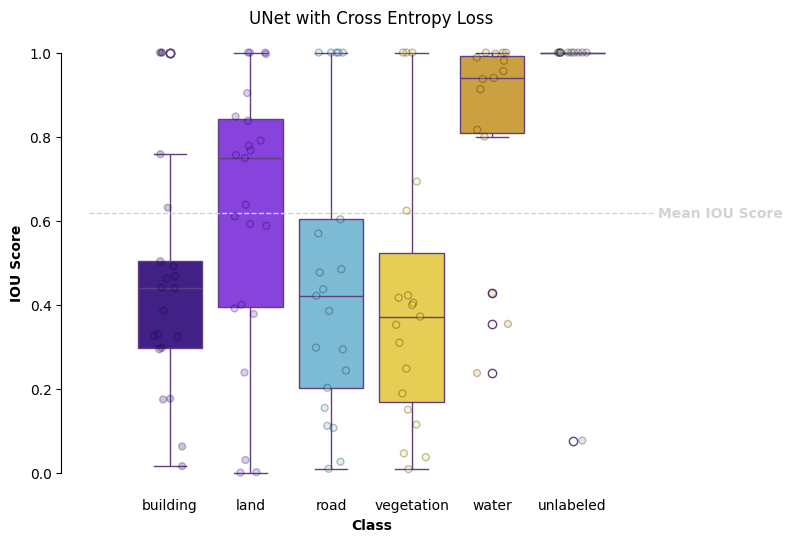

In [42]:
iou_scores = get_iou_by_class(iou_list)

fig, ax = plt.subplots(figsize=(8, 6))

sns.boxplot(
    iou_scores,
    palette=['#3C1098', '#8429F6', '#6EC1E4', '#FEDD3A', '#E2A929', '#9B9B9B'],
    ax=ax,
    linecolor='#603F83FF'
)
sns.stripplot(
    iou_scores,
    palette=['#3C1098', '#8429F6', '#6EC1E4', '#FEDD3A', '#E2A929', '#9B9B9B'],
    ax=ax,
    alpha=0.25,
    edgecolor='black',
    linewidth=1,
    jitter=0.2
)
ax.plot(
    [-1, 6], 
    [mean_iou_scores, mean_iou_scores],
    label="Test accuracy",
    color="lightgray",
    linestyle="--",
    linewidth=1,
)
ax.text(
    6 * 1.01,
    mean_iou_scores,
    "Mean IOU Score",
    color="lightgray",
    fontweight="bold",
    horizontalalignment="left",
    verticalalignment="center",
)

ax.set_xticks(range(dataset.num_classes), dataset.mask_labels)
ax.tick_params(axis='x', length=0)

ax.spines["right"].set_visible(False)
ax.spines["bottom"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["left"].set_bounds(0, 1)

ax.set_xlabel('Class', fontweight="bold")
ax.set_ylabel('IOU Score', fontweight="bold")

plt.title('UNet with Cross Entropy Loss')
plt.show()